In [28]:
import pandas as pd

ek_data = pd.read_csv("data/datasets/ko_ais_test.csv", header=0, skiprows=0, encoding='cp949', index_col=None)

del ek_data["Unnamed: 0"]

ek_data

,mmsi,timestam,lat,lon,speed,course,heading,turnrate,breath,vessel_type,vessel_max_speed,draft,power,dwt,iceclass
0,440112640,2019-09-01 00:00:00,35.424542,129.363403,0.0,345.1,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
1,440112540,2019-09-01 00:00:00,35.859227,126.175447,0.3,331.2,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
2,440111850,2019-09-01 00:00:00,34.880913,128.696927,0.1,31.3,359.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
3,4415511,2019-09-01 00:00:00,34.769218,126.379087,0.0,0.0,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
4,440500014,2019-09-01 00:00:00,36.113027,126.138165,5.4,1.0,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4210261,440105680,2019-09-01 04:57:34,33.416072,127.192950,0.8,102.9,511.0,0.0,9.0,52.0,16.0,3.0,10000.0,73.0,IA
4210262,440238000,2019-09-01 04:57:34,34.172583,127.729350,2.9,298.7,281.0,0.0,9.0,52.0,16.0,3.0,10000.0,73.0,IA
4210263,440503550,2019-09-01 04:57:34,35.844767,125.940550,0.1,229.0,511.0,0.0,9.0,52.0,16.0,3.0,10000.0,73.0,IA
4210264,563069300,2019-09-01 04:57:34,34.400710,125.839643,8.0,78.4,70.0,0.0,9.0,52.0,16.0,3.0,10000.0,73.0,IA


In [29]:
import numpy as np
import pandas as pd
import os
import time
import matplotlib.pyplot as plt
%matplotlib inline 
from mpl_toolkits.basemap import Basemap  # import Basemap matplotlib toolkit

DATA_DIR = "data/datasets/"

ais = pd.read_csv(DATA_DIR +'ko_ais_test.csv', index_col=0, parse_dates = ['timestam'])


/usr/local/lib/python3.6/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [30]:
ais_moving = ais[(ais.speed > 0.1)]

In [31]:
print(len(ais.mmsi))
print(len(ais_moving.mmsi))

4210266
2357966


In [32]:
ais.head()

,mmsi,timestam,lat,lon,speed,course,heading,turnrate,breath,vessel_type,vessel_max_speed,draft,power,dwt,iceclass
0,440112640,2019-09-01,35.424542,129.363403,0.0,345.1,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
1,440112540,2019-09-01,35.859227,126.175447,0.3,331.2,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
2,440111850,2019-09-01,34.880913,128.696927,0.1,31.3,359.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
3,4415511,2019-09-01,34.769218,126.379087,0.0,0.0,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA
4,440500014,2019-09-01,36.113027,126.138165,5.4,1.0,511.0,0.0,6.0,32.0,16.0,0.3,10000.0,203.0,IA


In [33]:
ais.describe()

,mmsi,lat,lon,speed,course,heading,turnrate,breath,vessel_type,vessel_max_speed,draft,power,dwt
count,4.210266e+06,4.210266e+06,4.210265e+06,4.210265e+06,4.210265e+06,4.210265e+06,4210265.0,4.210265e+06,4.210265e+06,4210265.0,4.210265e+06,4210265.0,4.210265e+06
mean,4.370824e+08,3.521537e+01,1.274394e+02,3.625775e+00,1.572847e+02,3.833193e+02,0.0,6.851470e+00,3.602137e+01,16.0,1.994494e+00,10000.0,3.421951e+03
std,8.408239e+07,1.301862e+00,1.478960e+00,5.987527e+00,1.162473e+02,1.746287e+02,0.0,9.949311e+00,3.534411e+01,0.0,3.052112e+00,0.0,1.563461e+04
min,0.000000e+00,3.000000e+00,1.245000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,16.0,0.000000e+00,10000.0,0.000000e+00
25%,4.400769e+08,3.429124e+01,1.262534e+02,0.000000e+00,4.680000e+01,2.370000e+02,0.0,0.000000e+00,0.000000e+00,16.0,0.000000e+00,10000.0,0.000000e+00
50%,4.401460e+08,3.508301e+01,1.269842e+02,3.000000e-01,1.560000e+02,5.110000e+02,0.0,4.000000e+00,3.000000e+01,16.0,0.000000e+00,10000.0,1.400000e+01
75%,4.403332e+08,3.606218e+01,1.289528e+02,7.500000e+00,2.568000e+02,5.110000e+02,0.0,1.000000e+01,5.600000e+01,16.0,3.800000e+00,10000.0,2.180000e+02
max,1.000000e+09,3.849991e+01,1.320000e+02,1.023000e+02,4.095000e+02,5.110000e+02,0.0,7.000000e+01,2.200000e+02,16.0,1.980000e+01,10000.0,2.211420e+05


/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:2019: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:249: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:251: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


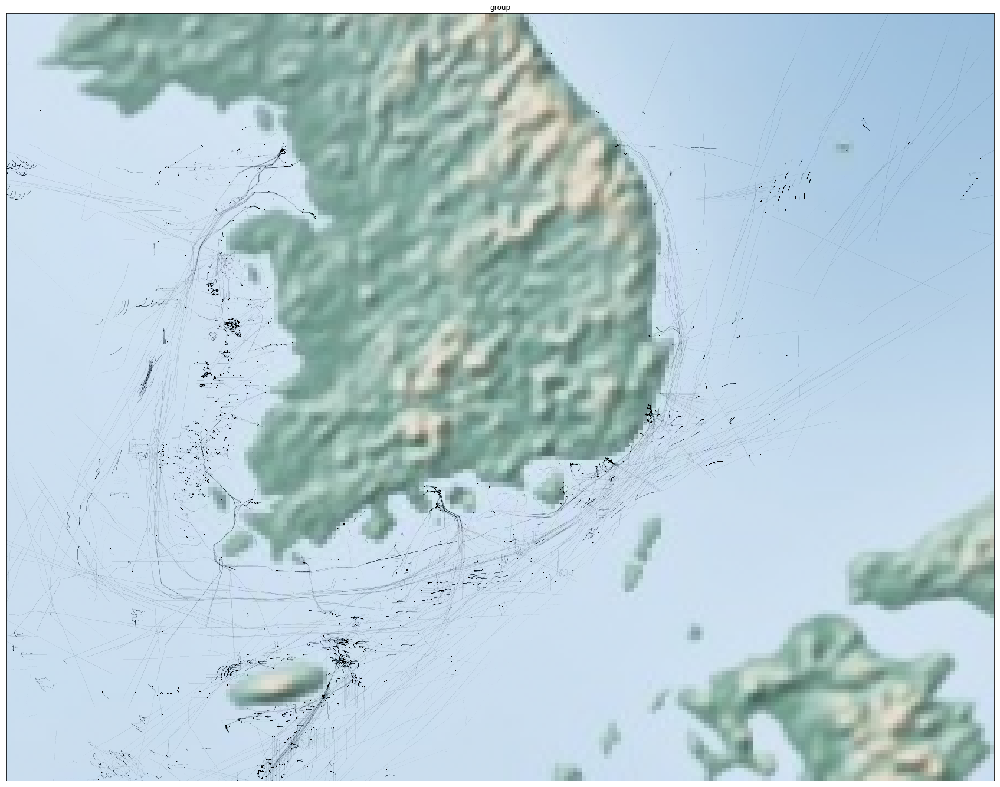

In [34]:
fig = plt.figure(figsize=(30,30))
plt.title("group")
m = Basemap(llcrnrlon = ais_moving.lon.min(),llcrnrlat = ais_moving.lat.min(), urcrnrlon = ais_moving.lon.max(),
       urcrnrlat = ais_moving.lat.max(),
       resolution='l')
m.shadedrelief()
xy = ais_moving.loc[:, ('lat', 'lon')]
plt.plot(xy.loc[:, ('lon')], xy.loc[:, ('lat')], 'o', c='black', alpha=0.005, markersize=1)
plt.show()

In [8]:
print(ais.timestamp.min())
print(ais[ais.timestamp < '2019-09-01'].timestamp.max())
print(ais[ais.timestamp > '2018-03-01'].timestamp.min())
print(ais.timestamp.max())

2017-11-01 09:08:40
2018-01-17 23:57:57
2018-05-18 00:01:49
2018-10-21 17:22:18


In [35]:
print('len of ais:        ', len(ais.mmsi))
print('len of aismoving:  ', len(ais_moving.mmsi))

len of ais:         4210266
len of aismoving:   2357966


In [36]:
print('Unique vessels:', len(ais_moving.mmsi.drop_duplicates()))

Unique vessels: 4437


In [37]:
# Vessel type distribution
(ais_moving.vessel_type.dropna().value_counts(normalize=True)*100)

0.0      34.142350
30.0     22.309058
52.0     13.254771
70.0     10.311048
80.0      6.022309
60.0      2.566449
32.0      1.539378
90.0      1.036020
50.0      0.866510
71.0      0.815279
56.0      0.794032
31.0      0.665022
40.0      0.460566
200.0     0.437368
79.0      0.428038
37.0      0.414679
99.0      0.380709
83.0      0.322736
155.0     0.253142
55.0      0.252082
54.0      0.215058
185.0     0.214125
82.0      0.207806
73.0      0.194914
75.0      0.187322
81.0      0.183378
140.0     0.181767
204.0     0.181428
196.0     0.171419
20.0      0.165015
151.0     0.164803
89.0      0.148518
51.0      0.132148
215.0     0.119001
220.0     0.117050
33.0      0.098220
77.0      0.038805
72.0      0.007676
Name: vessel_type, dtype: float64

In [40]:
ais_types = ais.groupby('vessel_type')
rows = []
for vessel_type, observations in ais_types:
    print(str(vessel_type)+ ' Mean speed:', observations.speed.mean())
    print(str(vessel_type)+ ' Median speed:', observations.speed.median())
    rows.append([vessel_type, observations.speed.mean()])
    
mean_speeds = pd.DataFrame(rows, columns=['Vessel Type', 'Mean Speed (m/s)'])

0.0 Mean speed: 3.578953275399539
0.0 Median speed: 0.3
20.0 Mean speed: 4.047398410556305
20.0 Median speed: 0.5
30.0 Mean speed: 3.6177016657946806
30.0 Median speed: 0.3
31.0 Mean speed: 3.5233322761391266
31.0 Median speed: 0.3
32.0 Mean speed: 3.6081136649584193
32.0 Median speed: 0.3
33.0 Mean speed: 3.303068932955618
33.0 Median speed: 0.3
37.0 Mean speed: 3.835301403798514
37.0 Median speed: 0.4
40.0 Mean speed: 3.902913138414017
40.0 Median speed: 0.4
50.0 Mean speed: 3.6463458159455304
50.0 Median speed: 0.3
51.0 Mean speed: 3.337487179487179
51.0 Median speed: 0.2
52.0 Mean speed: 3.7273101437470824
52.0 Median speed: 0.3
54.0 Mean speed: 4.250005894141223
54.0 Median speed: 0.6
55.0 Mean speed: 3.6454917642578315
55.0 Median speed: 0.3
56.0 Mean speed: 3.907175258995893
56.0 Median speed: 0.4
60.0 Mean speed: 3.754908233073838
60.0 Median speed: 0.3
70.0 Mean speed: 3.605618226464562
70.0 Median speed: 0.3
71.0 Mean speed: 3.6408370581064604
71.0 Median speed: 0.3
72.0 Mean

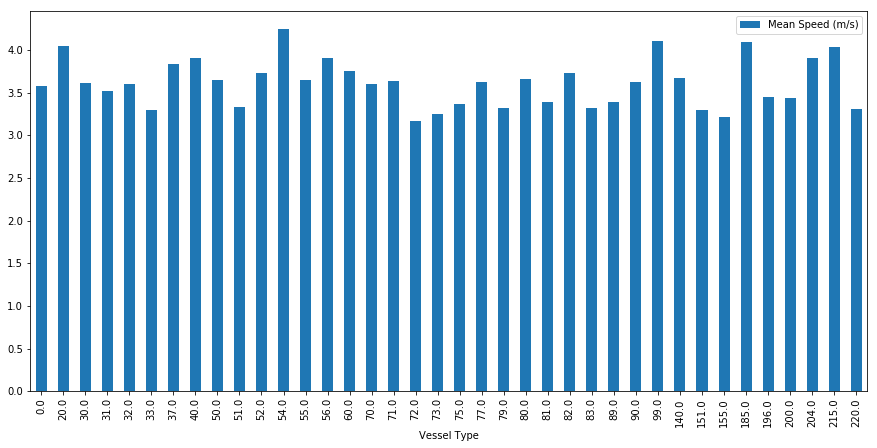

In [41]:
mean_speeds = mean_speeds.set_index('Vessel Type')
mean_speeds.plot(kind='bar',figsize=(15,7))

##### Describing AIS observations by vessel types

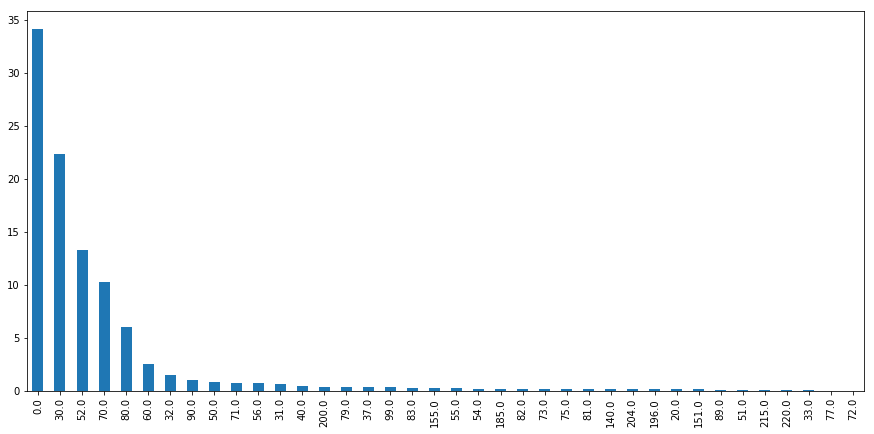

In [42]:
# The most common vessel types in AIS observations
(ais_moving.vessel_type.dropna().value_counts(normalize=True)*100).plot(kind='bar',figsize=(15,7))

In [43]:
type_groups = ais.vessel_type.dropna().drop_duplicates().reset_index(drop=True)
type_groups = type_groups.to_dict()
type_groups = {v: k for k, v in type_groups.items()}
type_groups

{32.0: 0,
 52.0: 1,
 30.0: 2,
 50.0: 3,
 0.0: 4,
 200.0: 5,
 70.0: 6,
 60.0: 7,
 55.0: 8,
 80.0: 9,
 79.0: 10,
 90.0: 11,
 155.0: 12,
 73.0: 13,
 33.0: 14,
 37.0: 15,
 81.0: 16,
 83.0: 17,
 71.0: 18,
 82.0: 19,
 151.0: 20,
 220.0: 21,
 77.0: 22,
 31.0: 23,
 89.0: 24,
 51.0: 25,
 196.0: 26,
 75.0: 27,
 72.0: 28,
 140.0: 29,
 215.0: 30,
 20.0: 31,
 99.0: 32,
 40.0: 33,
 204.0: 34,
 56.0: 35,
 185.0: 36,
 54.0: 37}

In [72]:
type_groups[52]

1

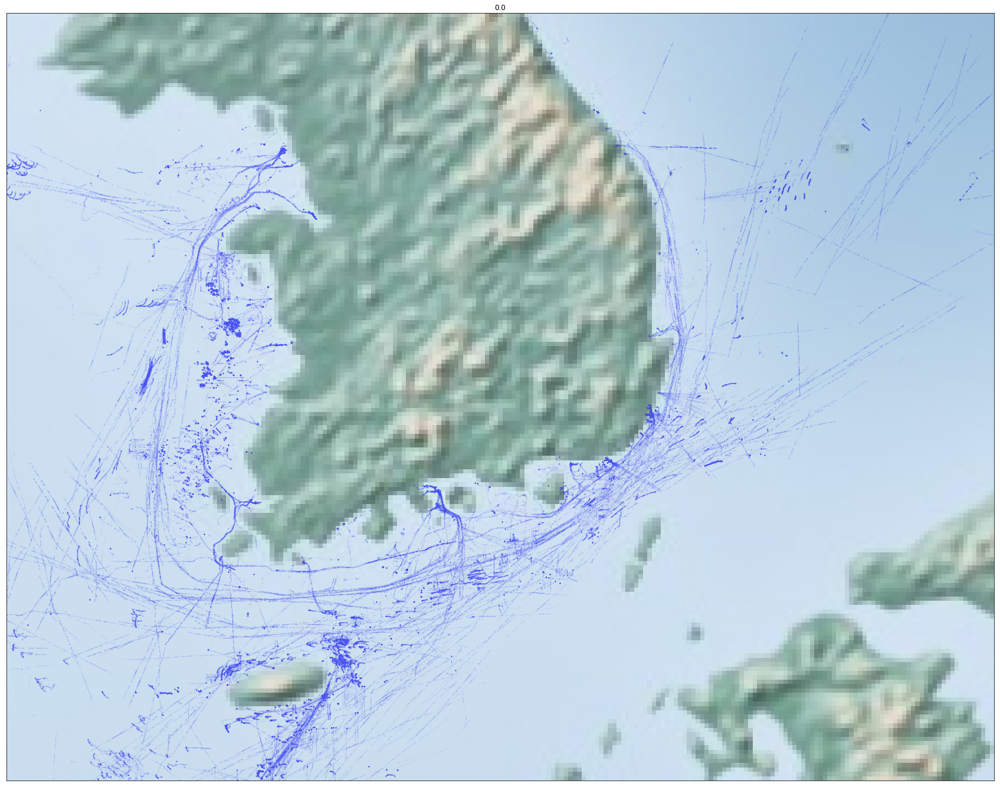

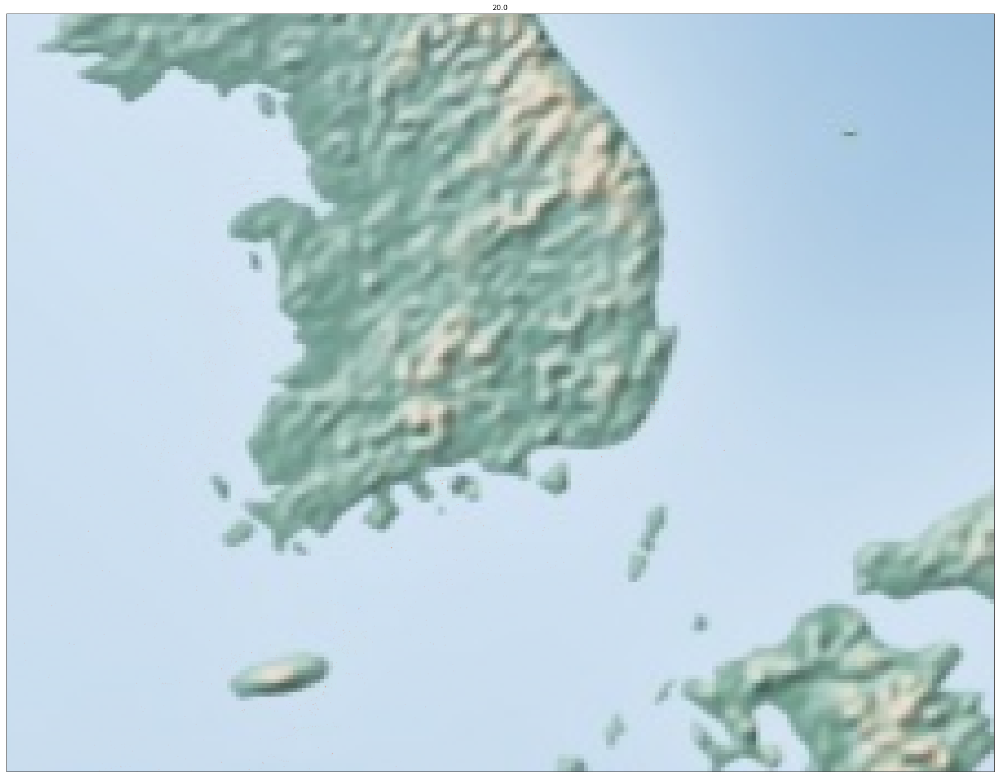

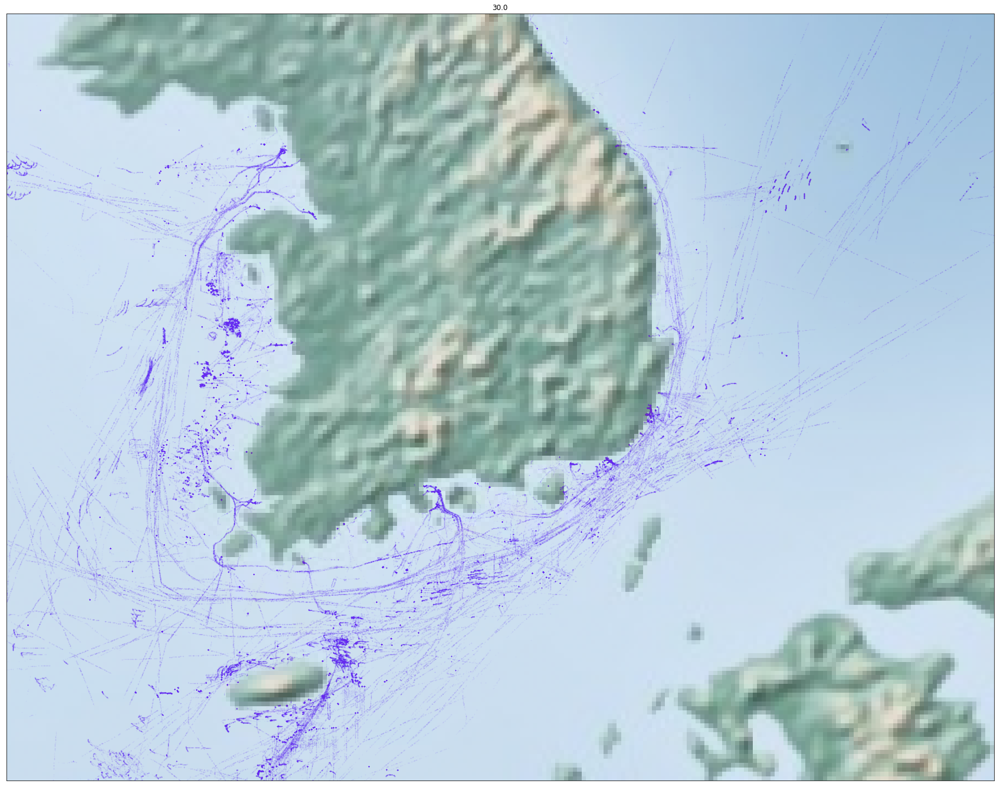

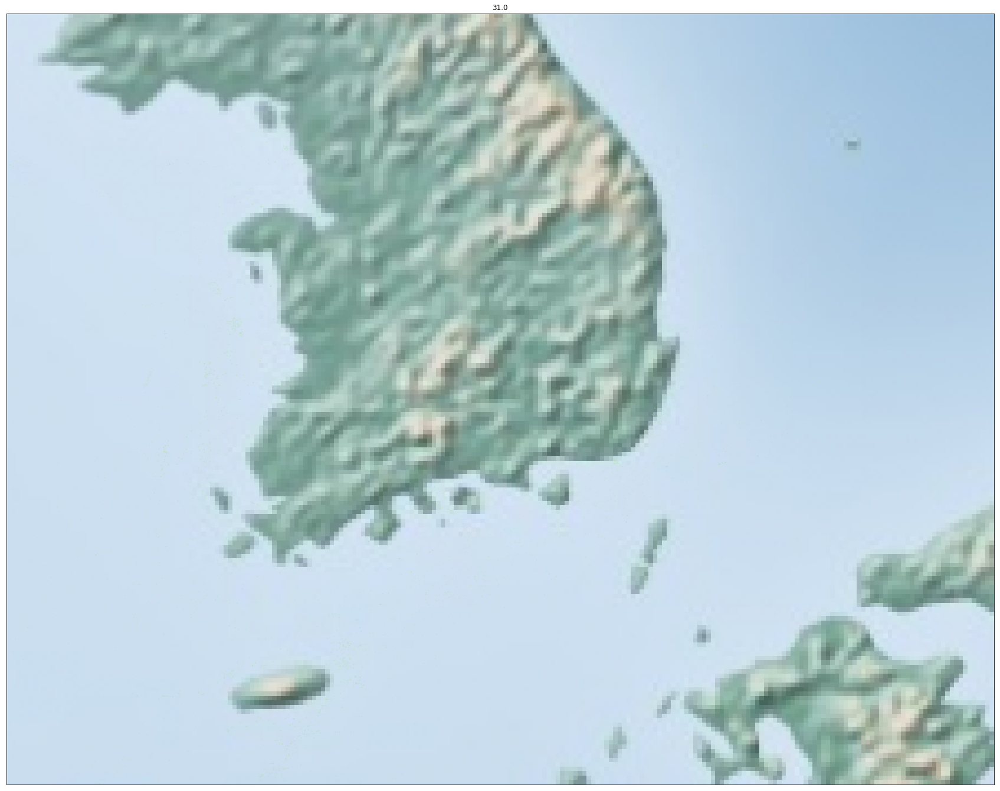

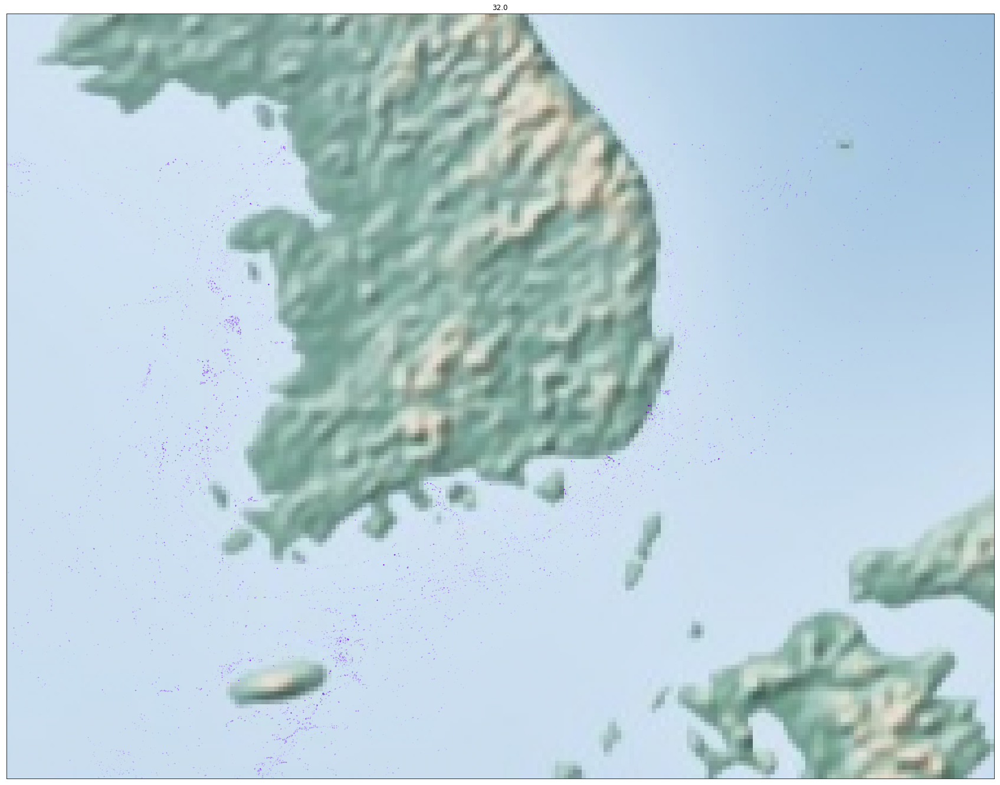

...

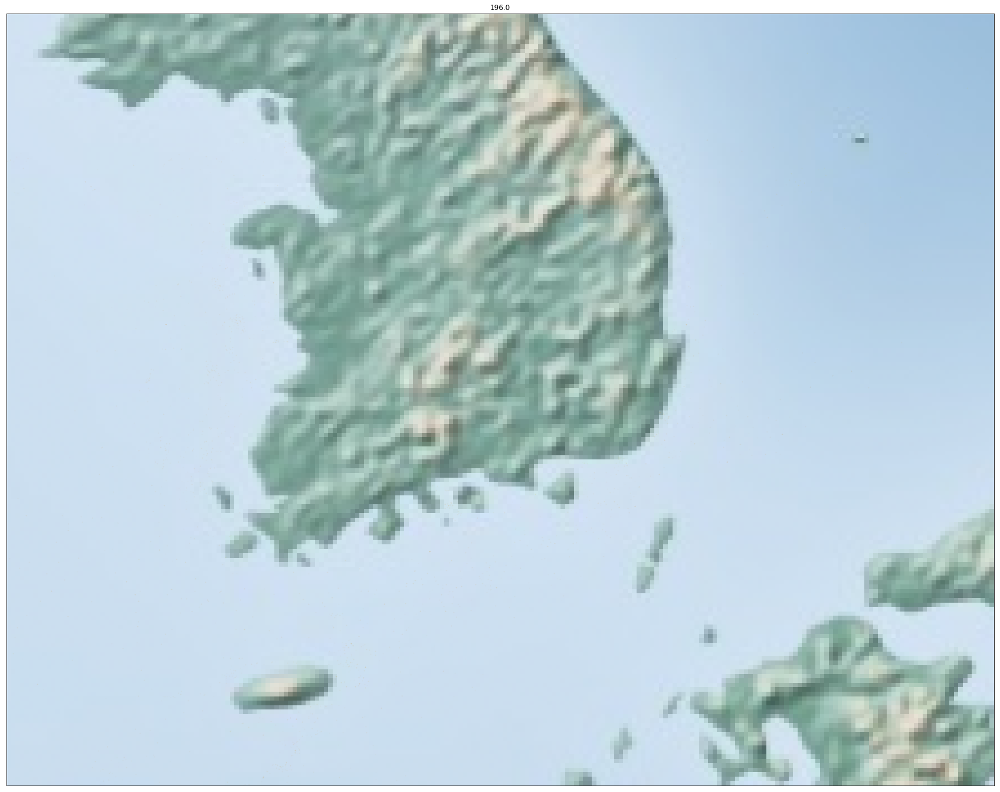

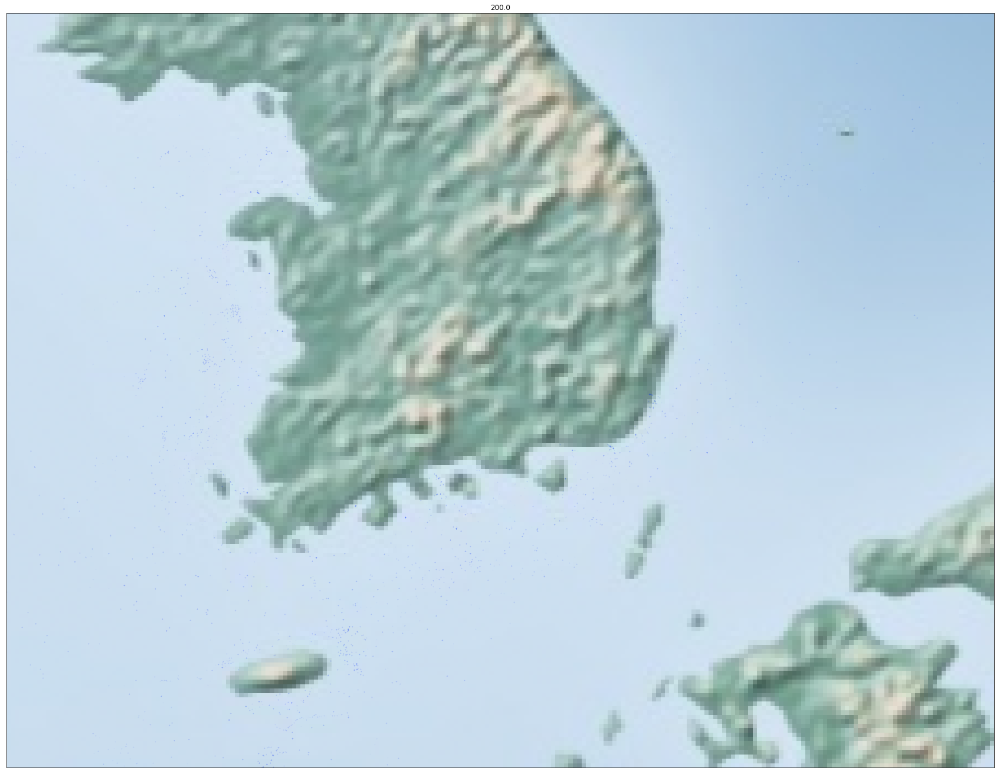

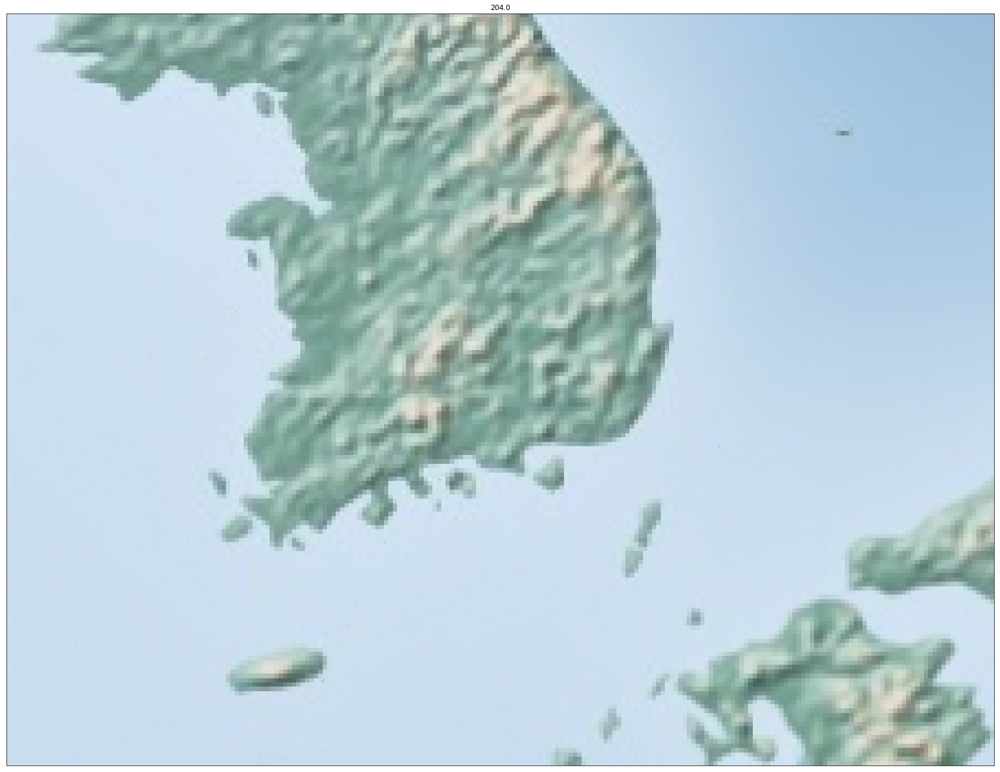

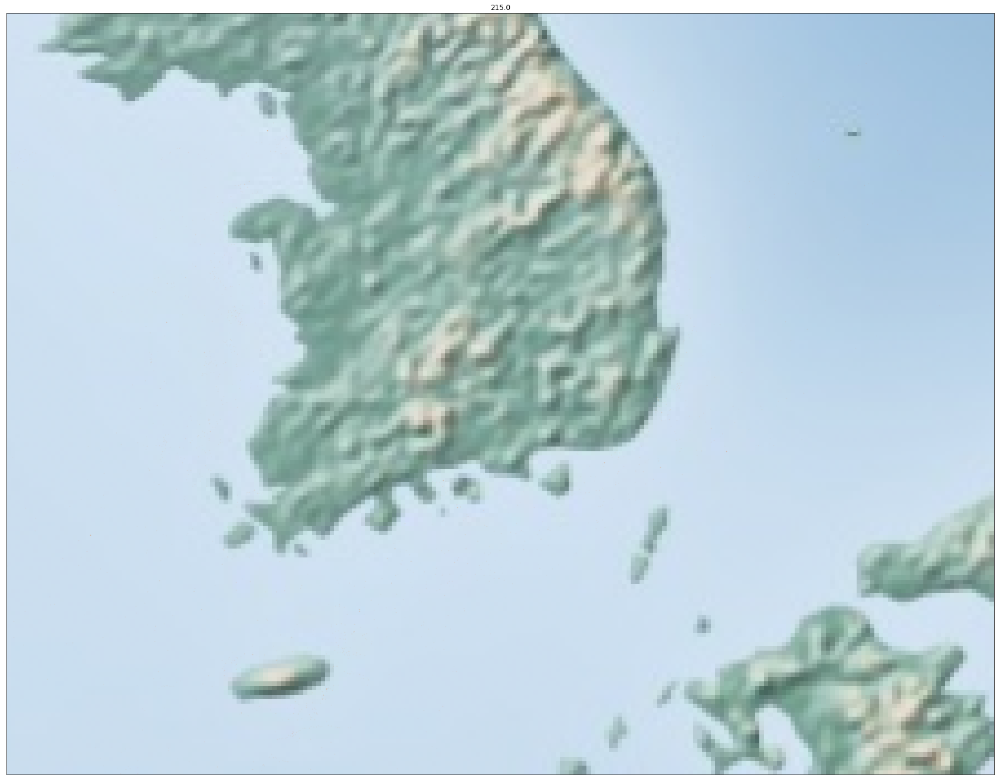

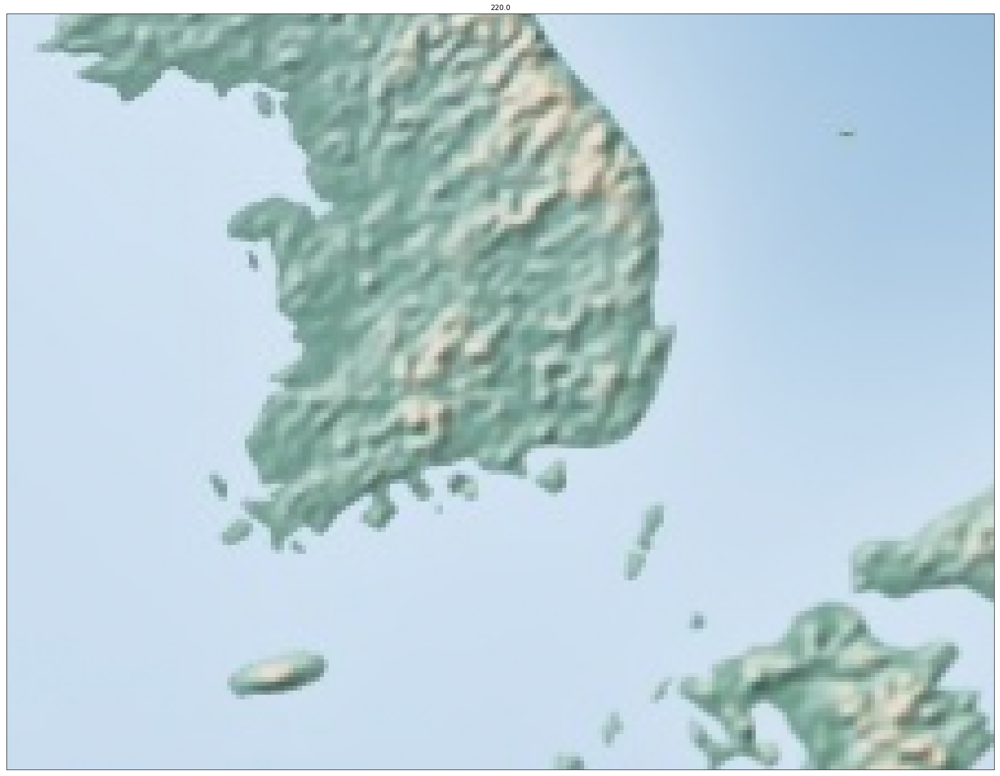

In [73]:
ais_summer_draft_groups = ais_moving.groupby('vessel_type')
#colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:}

#colors = ['red', 'grey', 'blue', 'green', 'black']

c_list = [plt.cm.rainbow(a) for a in np.linspace(0.0, 1.0, len(type_groups))]

for group, observations in ais_summer_draft_groups:
    fig = plt.figure(figsize=(30,30))
    plt.title(group)
    m = Basemap(llcrnrlon = observations.lon.min(),llcrnrlat = observations.lat.min(), urcrnrlon = observations.lon.max(),
           urcrnrlat = observations.lat.max(),
           resolution='l')
    m.shadedrelief()
    xy = observations.loc[:, ('lat', 'lon')]
    #color = colors[type_groups[group]]
    plt.plot(xy.loc[:, ('lon')], xy.loc[:, ('lat')], 'o', color=c_list[int(type_groups[group])], alpha=0.025, markersize=1)
    plt.show()